## Clustering Drug Recall and Enforcement Topics.
#### Topic Mining: Visualizing topics in text with LDA

####  **AI LAB TEAM** - Persistent Systems Ltd.


## Table of contents


1. [Step 1: Environment Setup](#Step-1:-Environment-Setup)

2. [Step 2: Data acquisition from OpenFDA](#Step-2:-Data-acquisition-from-OpenFDA)

3. [Step 3: Data analysis](#Step-3:-Data-analysis)
    - [Data discovery](#Data-discovery)
    - [Text processing : tokenization](#Text-processing-:-tokenization)
    - [Text processing : tf-idf](#Text-processing-:-tf-idf)

4. [Step 4: Clustering](#Step-4:-Clustering)
    - [KMeans](#KMeans)
    - [Latent Dirichlet Allocation](#Latent-Dirichlet-Allocation)
    - [Visualization of the topics using pyLDAvis](#Visualization-of-the-topics-using-pyLDAvis)

5. [Step 5: Conclusion](#Step-5:-Conclusion)

6. [Step 6: References](#Step-6:-References)

### Introduction

## Step 1: Environment Setup

[[ go back to the top ]](#Table-of-contents)

We suggest downloading the Anaconda distribution for python 3.6 from this <a href="https://www.continuum.io/downloads">link</a>. This distribution wraps python with the necessary packages used in data science like Numpy, Pandas, Scipy or Scikit-learn.

For the purpose of this tutorial we'll also have to download external packages:

- **tqdm** (a progress bar python utility) from this command: pip install tqdm
- **nltk** (for natural language processing) from this command: conda install -c anaconda nltk=3.2.2
- **bokeh** (for interactive data viz) from this command: conda install bokeh
- **lda** (the python implementation of Latent Dirichlet Allocation) from this command: pip install lda
- **pyldavis** (python package to visualize lda topics): pip install pyldavis

To connect to the Newsapi service you'll have to create an account at https://newsapi.org/register to get a key. It's totally free. Then you'll have to put your key in the code and run the script on your own if you want to. 

## Step 2: Data acquisition from OpenFDA

[[ go back to the top ]](#Table-of-contents)

https://open.fda.gov/downloads/
The JSON file resulting from this response download is pretty straightforward:

```
{
      "classification": "Class II",
      "center_classification_date": "20170315",
      "report_date": "20170322",
      "postal_code": "92117-7310",
      "recall_initiation_date": "20170210",
      "recall_number": "D-0546-2017",
      "city": "San Diego",
      "event_id": "76472",
      "distribution_pattern": "Nationwide within the United States",
      "openfda": {},
      "recalling_firm": "Synergy Rx",
      "voluntary_mandated": "Voluntary: Firm Initiated",
      "state": "CA",
      "reason_for_recall": "Lack of Assurance of Sterility: There are also CGMP Deviations. ",
      "initial_firm_notification": "Telephone",
      "status": "Ongoing",
      "product_type": "Drugs",
      "country": "United States",
      "product_description": "VITAMIN K OXIDE 5%, HQ 4%, Rx only, Synergy RX, 4901 Morena Blvd # 504-A San Diego, CA 92117 (855) 792-6676",
      "code_info": " All Lots",
      "address_1": "4901 Morena Blvd Ste 504A",
      "address_2": "",
      "product_quantity": ""
    }
```

Let's get into the code to see how to manage this data acquisition:

In [4]:
# import packages
import requests
import pandas as pd
from datetime import datetime
from tqdm import tqdm
from matplotlib import pyplot as plt
import json

In this post, we'll be analyzing english news sources only. 

In [17]:
def get_reason_for_recall():
    all_recalls = []
    with open('drug-enforcement-0001-of-0001.json') as data_file:    
        data = json.load(data_file)
    for res in data['results']:
        recalls = [uniq_reason for uniq_reason in res['reason_for_recall'].split(';')]
        all_recalls.extend(recalls)
    return set(all_recalls)

In [19]:
all_uniq_reasons = get_reason_for_recall()
print('number of unique reasons :', len(all_uniq_reasons))
print('Reasons :', all_uniq_reasons)

number of unique reasons : 2602
Reasons : {'', 'Failed Impurities/Degradation Specifications: High out of specification impurity test results were obtained during stability testing.', 'Labeling: Label Error On Declared Strength: Trelstar 11.25 mg labeled carton/kit contained a vial labeled as 3.75 mg instead of a vial being labeled as 11.25mg.', ' some lots failed Antimicrobial Effectiveness Testing on stability', 'Subpotent (Single Ingredient Drug): The firm is recalling the product because the product is subpotent and does not meet the labeled 0.25% zinc pyrithione level.', 'Failed Impurities/Degradation Specifications: failed specification for unknown impurity at the 24 month stability testing. ', 'Failed Dissolution Specifications', '  THIAMINE HCL, Tablet, 100 mg, NDC 00904054460, Pedigree: AD54559_1, EXP: 5/20/2014.  ', ' lidding deformity allows the contained product to transpire causing potential viscosity and assay failures. The viscosity and assay failures were due to the los

Classes for each drug recalls

In [6]:
# a dictionary mapping each source id (from the list displayed above) to the corresponding news category
def mapping():
    d = {}
    response = requests.get('https://newsapi.org/v1/sources?language=en')
    response = response.json()
    for s in response['sources']:
        d[s['id']] = s['category']
    return d

In [10]:
# let's see what categories we have:
print('categories:', list(set(m.values())))

categories: ['science-and-nature', 'entertainment', 'technology', 'gaming', 'business', 'music', 'sport', 'general']


Ok, now this script needs to run repetitively to collect the data. 

Now that the data has been collected, we will start anlayzing it :

- We'll have a look at the dataset and inspect it
- We'll apply some preoprocessings on the texts: tokenization, tf-idf
- We'll cluster the articles using two different algorithms (Kmeans and LDA)
- We'll visualize the clusters using Bokeh and pyldavis

## Step 3: Data analysis

[[ go back to the top ]](#Table-of-contents)

### Data discovery
[[ go back to the top ]](#Table-of-contents)

In [27]:
%matplotlib inline
# pandas for data manipulation
import pandas as pd
pd.options.mode.chained_assignment = None
# nltk for nlp
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
# list of stopwords like articles, preposition
stop = set(stopwords.words('english'))
from string import punctuation
from collections import Counter
import re
import numpy as np

In [28]:
with open('drug-enforcement-0001-of-0001.json') as data_file:    
    drug_data = json.load(data_file)

In [29]:
data = pd.DataFrame.from_records(drug_data['results'])

The data is now ingested in a Pandas DataFrame.

Let's see how it looks like.

In [30]:
data.head()

,address_1,address_2,center_classification_date,city,classification,code_info,country,distribution_pattern,event_id,initial_firm_notification,...,product_type,reason_for_recall,recall_initiation_date,recall_number,recalling_firm,report_date,state,status,termination_date,voluntary_mandated
0,7050 Camp Hill Rd,,20120702,Fort Washington,Class III,"Lot #CMF023, Expiration 07/13.",United States,Nationwide,61872,Letter,...,Drugs,Defective Container; damaged blister units,20120517,D-1404-2012,"Mcneil Consumer Healthcare, Div Of Mcneil-ppc,...",20120711,PA,Terminated,20130411,Voluntary: Firm Initiated
1,600 N Field Dr Bldg J45,,20120620,Lake Forest,Class III,"Lot #: 04510KL*, Exp 01OCT2012; *lot number m...",United States,Nationwide,62053,Letter,...,Drugs,Superpotent (Single Ingredient) Drug: Above sp...,20120405,D-1390-2012,"Hospira, Inc.",20120627,IL,Terminated,20130808,Voluntary: Firm Initiated
2,12515 E 55th St Ste 100,,20120618,Tulsa,Class I,PTC Drug Number: 4033. PTC Batch Number: 65I...,United States,FL,61233,FAX,...,Drugs,Labeling: Label mix-up; Bottles labeled to con...,20101110,D-1385-2012,"Physicians Total Care, Inc",20120627,OK,Terminated,20120724,Voluntary: Firm Initiated
3,150 Signet Drive,,20120802,Toronto,Class II,"Lot #s: JN1060, JN1061, JN1062, Exp 06/12",Canada,Nationwide and Puerto Rico,62574,Letter,...,Drugs,Presence of Particulate Matter: Lots identifi...,20120430,D-1439-2012,Apotex Inc.,20120808,,Terminated,20130919,Voluntary: Firm Initiated
4,200 Somerset Corporate Blvd Fl 7th,,20120731,Bridgewater,Class II,C201293 Exp Date 08/2013,United States,Nationwide and Puerto Rico,62591,Letter,...,Drugs,Adulterated Presence of Foreign Tablets: Dr. R...,20120409,D-1434-2012,"Dr. Reddy's Laboratories, Inc.",20120808,NJ,Terminated,20130124,Voluntary: Firm Initiated


It's cool to have all these features. In this article, we will be mainly focusing on the description column.

Let's look at the data shape.

In [31]:
print('data shape:', data.shape)

data shape: (7002, 25)


Let's check the distribution of the different categories across the dataset.

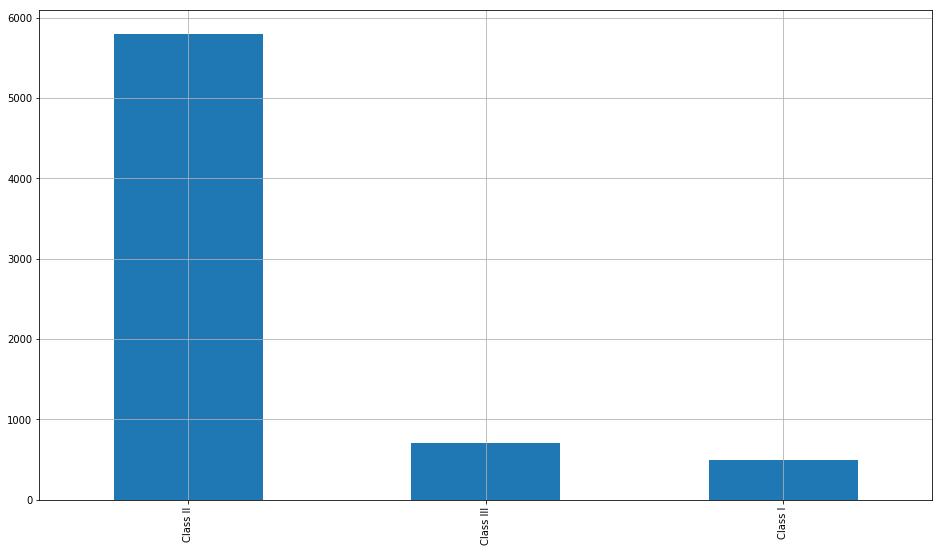

In [33]:
data.classification.value_counts().plot(kind='bar', grid=True, figsize=(16, 9))

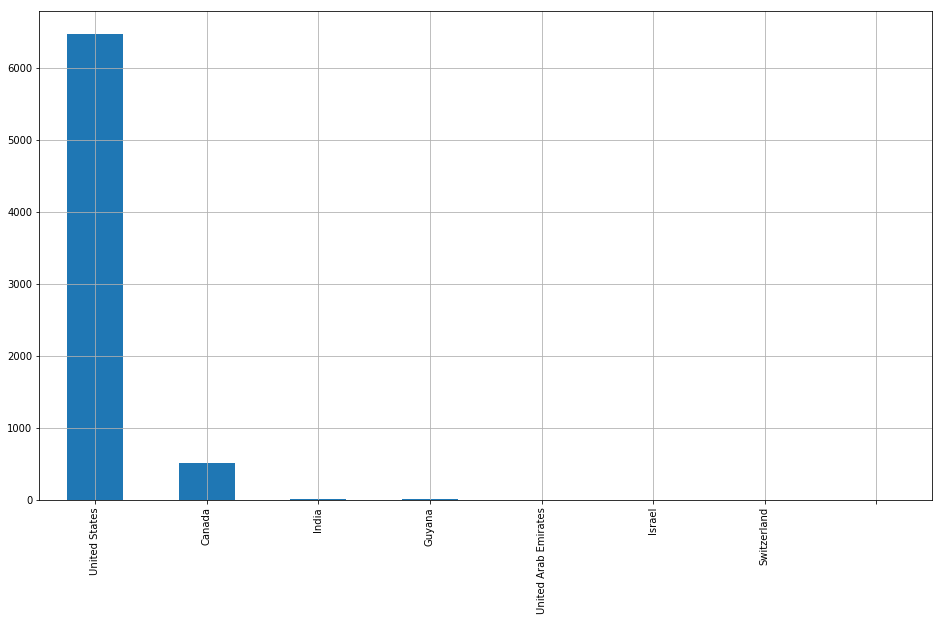

In [34]:
data.country.value_counts().plot(kind='bar', grid=True, figsize=(16, 9))

In [35]:
# remove duplicate description columns
data = data.drop_duplicates('product_description')

In [36]:
# remove rows with empty descriptions
data = data[~data['product_description'].isnull()]

In [37]:
data.shape

(6957, 25)

In [38]:
data['len'] = data['product_description'].map(len)

In [39]:
data.shape

(6957, 26)

### Text processing : tokenization
[[ go back to the top ]](#Table-of-contents)

Now we start by building a tokenizer. This will, for every description:

- break the descriptions into sentences and then break the sentences into tokens
- remove punctuation and stop words
- lowercase the tokens

In [40]:
def tokenizer(text):
    try:
        tokens_ = [word_tokenize(sent) for sent in sent_tokenize(text)]
        
        tokens = []
        for token_by_sent in tokens_:
            tokens += token_by_sent

        tokens = list(filter(lambda t: t.lower() not in stop, tokens))
        tokens = list(filter(lambda t: t not in punctuation, tokens))
        tokens = list(filter(lambda t: t not in [u"'s", u"n't", u"...", u"''", u'``', 
                                            u'\u2014', u'\u2026', u'\u2013'], tokens))
        filtered_tokens = []
        for token in tokens:
            if re.search('[a-zA-Z]', token):
                filtered_tokens.append(token)

        filtered_tokens = list(map(lambda token: token.lower(), filtered_tokens))

        return filtered_tokens
    except Error as e:
        print(e)

A new column 'tokens' can be easily created using the map method applied to the 'description' column.

In [41]:
data['tokens'] = data['product_description'].map(tokenizer)

The tokenizer has been applied to each description through all rows. Each resulting value is then put into the 'tokens' column that is created after the assignment. Let's check what the tokenization looks like for the first 5 descriptions:

In [42]:
for descripition, tokens in zip(data['product_description'].head(5), data['tokens'].head(5)):
    print('product_description:', descripition)
    print('tokens:', tokens)
    print() 

product_description: Imodium Multi-Symptom Relief Caplets, Loperamide HCl 2 mg/Simethicone 125 mg, 18 count blister pack cartons, McNeil Consumer Healthcare, Div of McNeil-PPC Inc., Fort Washington, PA
tokens: ['imodium', 'multi-symptom', 'relief', 'caplets', 'loperamide', 'hcl', 'mg/simethicone', 'mg', 'count', 'blister', 'pack', 'cartons', 'mcneil', 'consumer', 'healthcare', 'div', 'mcneil-ppc', 'inc.', 'fort', 'washington', 'pa']

product_description: Magnesium Sulfate in Water for Injection, 40 mg/mL (0.325 mEq Mg++/mL), 2 g total, 50 mL Flexible Container, Rx only, Hospira, Inc., Lake Forest, IL 60045; NDC 0409-6729-24.
tokens: ['magnesium', 'sulfate', 'water', 'injection', 'mg/ml', 'meq', 'mg++/ml', 'g', 'total', 'ml', 'flexible', 'container', 'rx', 'hospira', 'inc.', 'lake', 'forest', 'il', 'ndc']

product_description: Morphine Sulfate Extended Release tablet, 30 mg, 60 tablet bottles, Rx only, Physician Total Care, Inc, Tulsa, Ok 74146-6234, NDC 54868-4033-00   
tokens: ['morph

Let's group the tokens by category, apply a word count and display the top 10 most frequent tokens. 

In [47]:
def keywords(category):
    tokens = data[data['reason_for_recall'] == category]['tokens']
    alltokens = []
    for token_list in tokens:
        alltokens += token_list
    counter = Counter(alltokens)
    return counter.most_common(10)

In [ ]:
for category in set(data['reason_for_recall']):
    print('reason_for_recall :', category)
    print('top 10 keywords:', keywords(category))
    print('---')

reason_for_recall : Failed Impurities/Degradation Specifications: High out of specification impurity test results were obtained during stability testing.
top 10 keywords: [('tablets', 1), ('mg', 1), ('buprenorphine', 1), ('upc', 1), ('pharmaceuticals', 1), ('sublingual', 1), ('hydrochloride', 1), ('rx', 1), ('bottles', 1), ('ndc', 1)]
---
reason_for_recall : Labeling: Label Error On Declared Strength: Trelstar 11.25 mg labeled carton/kit contained a vial labeled as 3.75 mg instead of a vial being labeled as 11.25mg.
top 10 keywords: [('single-dose', 2), ('ndc', 2), ('pharma', 1), ('rx', 1), ('sterile', 1), ('injectable', 1), ('inc.', 1), ('debio', 1), ('triptorelin', 1), ('vial', 1)]
---
reason_for_recall : Labeling:Label Mixup; MISOPROSTOL Tablet, 200 mcg may be potentially mislabeled as    PROPRANOLOL HCL, Tablet, 10 mg, NDC 23155011001, Pedigree: AD21790_34, EXP: 5/1/2014;  SODIUM CHLORIDE, Tablet, 1 mg, NDC 00223176001, Pedigree: W003115, EXP: 6/13/2014.  
top 10 keywords: [('distr

Looking at these lists, we can formulate some hypotheses:

- the sport category deals with the champions' league, the footbal season and NFL
- some tech articles refer to Google
- the business news seem to be highly correlated with US politics and Donald Trump (this mainly originates from us press)

Extracting the top 10 most frequent words per each category is straightforward and can point to important keywords. 

However, although we did preprocess the descriptions and remove the stop words before, we still end up with words that are very generic (e.g: today, world, year, first) and don't carry a specific meaning that may describe a topic.

As a first approach to prevent this, we'll use tf-idf

### Text processing : tf-idf
[[ go back to the top ]](#Table-of-contents)

tf-idf stands for term frequencey-inverse document frequency. It's a numerical statistic intended to reflect how important a word is to a document or a corpus (i.e a collection of documents). 

To relate to this post, words correpond to tokens and documents correpond to descriptions. A corpus is therefore a collection of descriptions.

The tf-idf a of a term t in a document d is proportional to the number of times the word t appears in the document d but is also offset by the frequency of the term t in the collection of the documents of the corpus. This helps adjusting the fact that some words appear more frequently in general and don't especially carry a meaning.

tf-idf acts therefore as a weighting scheme to extract relevant words in a document.

$$tfidf(t,d) = tf(t,d) . idf(t) $$

$tf(t,d)$ is the term frequency of t in the document d (i.e. how many times the token t appears in the description d)

$idf(t)$ is the inverse document frequency of the term t. it's computed by this formula:

$$idf(t) = log(1 + \frac{1 + n_d}{1 + df(d,t)}) $$

- $n_d$ is the number of documents
- $df(d,t)$ is the number of documents (or descriptions) containing the term t

Computing the tfidf matrix is done using the TfidfVectorizer method from scikit-learn. Let's see how to do this:

In [49]:
from sklearn.feature_extraction.text import TfidfVectorizer

# min_df is minimum number of documents that contain a term t
# max_features is maximum number of unique tokens (across documents) that we'd consider
# TfidfVectorizer preprocesses the descriptions using the tokenizer we defined above

vectorizer = TfidfVectorizer(min_df=10, max_features=10000, tokenizer=tokenizer, ngram_range=(1, 2))
vz = vectorizer.fit_transform(list(data['product_description']))

In [50]:
vz.shape

(6957, 2824)

vz is a tfidf matrix. 

- its number of rows is the total number of documents (descriptions) 
- its number of columns is the total number of unique terms (tokens) across the documents (descriptions)

$x_{dt}  = tfidf(t,d)$ where $x_{dt}$ is the element at the index (d,t) in the matrix.

Let's create a dictionary mapping the tokens to their tfidf values 

In [51]:
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

We can visualize the distribution of the tfidf scores through an histogram

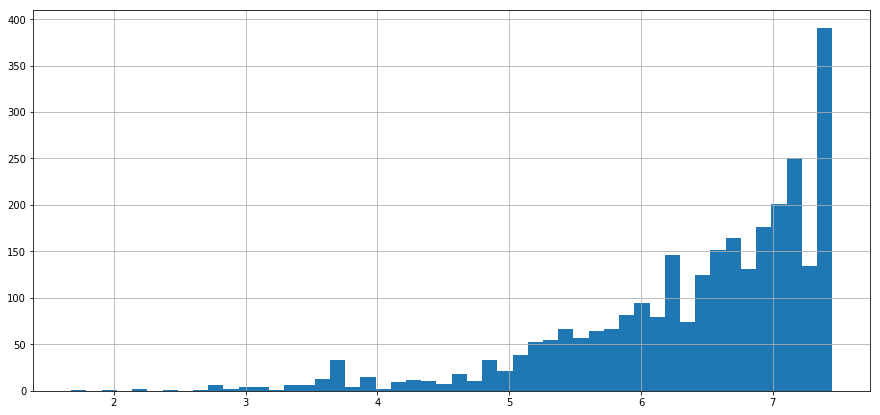

In [52]:
tfidf.tfidf.hist(bins=50, figsize=(15,7))

Let's display the 30 tokens that have the lowest tfidf scores 

In [53]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(30)

,tfidf
rx,1.677179
ndc,1.971009
ml,2.150526
pharmacy,2.161944
mg,2.381992
packaged,2.663018
distributed,2.736135
compounding,2.741861
inc.,2.769306
pharmaceuticals,2.799261


In [54]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(30)

,tfidf
marietta ga,7.449752
ut,7.449752
venlafaxine hydrochloride,7.449752
indiana pa,7.449752
deltona fl,7.449752
marietta,7.449752
vehicle,7.449752
bags/drum repackaging,7.449752
hill pa,7.449752
wrapped,7.449752


We end up with less common words. These words naturally carry more meaning for the given description and may outline the underlying topic.

As you've noticed, the documents have more than 4000 features (see the vz shape). put differently, each document has more than 4000 dimensions.

If we want to plot them like we usually do with geometric objects, we need to reduce their dimension to 2 or 3 depending on whether we want to display on a 2D plane or on a 3D space. This is what we call dimensionality reduction.

To perform this task, we'll be using a combination of two popular techniques: Singular Value Decomposition (SVD) to reduce the dimension to 50 and then t-SNE to reduce the dimension from 50 to 2. t-SNE is more suitable for dimensionality reduction to 2 or 3.

Let's start reducing the dimension of each vector to 50 by SVD.

In [55]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=50, random_state=0)
svd_tfidf = svd.fit_transform(vz)

In [56]:
svd_tfidf.shape

(6957, 50)

Bingo. Now let's do better. From 50 to 2!

In [57]:
from sklearn.manifold import TSNE

tsne_model = TSNE(n_components=2, verbose=1, random_state=0)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 6957
[t-SNE] Computed conditional probabilities for sample 2000 / 6957
[t-SNE] Computed conditional probabilities for sample 3000 / 6957
[t-SNE] Computed conditional probabilities for sample 4000 / 6957
[t-SNE] Computed conditional probabilities for sample 5000 / 6957
[t-SNE] Computed conditional probabilities for sample 6000 / 6957
[t-SNE] Computed conditional probabilities for sample 6957 / 6957
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 100 iterations with early exaggeration: 1.352888
[t-SNE] Error after 275 iterations: 1.352888


Let's check the size.

In [58]:
tsne_tfidf.shape

(6957, 2)

Each description is now modeled by a two dimensional vector. 

Let's see what tsne_idf looks like.

In [59]:
tsne_tfidf

array([[ -1.82596804,  -1.61758188],
       [  8.86843705,   2.30525185],
       [  2.97942023,  -2.46021909],
       ..., 
       [  4.68637749,  11.87930362],
       [  4.39501109,  12.35339839],
       [  4.21521542,  12.63662688]])

We're having two float numbers per discription. This is not interpretable at first sight. 

What we need to do is find a way to display these points on a plot and also attribute the corresponding description to each point.

matplotlib is a very good python visualization libaray. However, we cannot easily use it to display our data since we need interactivity on the objects. One other solution could be d3.js that provides huge capabilities in this field. 

Right now I'm choosing to stick to python so I found a tradeoff : it's called Bokeh.

"Bokeh is a Python interactive visualization library that targets modern web browsers for presentation. Its goal is to provide elegant, concise construction of novel graphics in the style of D3.js, and to extend this capability with high-performance interactivity over very large or streaming datasets. Bokeh can help anyone who would like to quickly and easily create interactive plots, dashboards, and data applications." To know more, please refer to this <a href="http://bokeh.pydata.org/en/latest/"> link </a>

Let's start by importing bokeh packages and initializing the plot figure.

In [60]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook

In [61]:
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600, title="tf-idf clustering of the news",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

Loading BokehJS ...

In [62]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
tfidf_df['product_description'] = data['product_description']
tfidf_df['reason_for_recall'] = data['reason_for_recall']

Bokeh need a pandas dataframe to be passed as a source data. this is a very elegant way to read data.

In [64]:
plot_tfidf.scatter(x='x', y='y', source=tfidf_df)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"product_description": "@product_description", "reason_for_recall":"@reason_for_recall"}
show(plot_tfidf)

Bokeh charts offer many functionalities:

- navigating in the data
- zooming
- hovering on each data point and displaying the corresponding description
- saving the chart

When the description popup doesn't show properly you have to move the data point slightly on the left.

By hovering on each news cluster, we can see groups of descriptions of similar keywords and thus referring to the same topic.

Now we're going to use clustering algorithms on the tf-idf matrix.

## Step 4: Clustering
[[ go back to the top ]](#Table-of-contents)

### KMeans
[[ go back to the top ]](#Table-of-contents)

Our starting point is the tf-idf matrix vz. Let's check its size again.

In [65]:
vz.shape

(6957, 2824)

This matrix can be seen as a collection of (x) high-dimensional vectors (y). Some algorithms like K-means can crunch this data structure and produce blocks of similar or "close" data points based on some similarity measure like the euclidean distance.

One thing to know about Kmeans is that it needs the number of clusters up front. This number is usually found by trying different values until the result looks satisfactory.

I found that 20 was a good number that separates the dataset nicely.

In [66]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from sklearn.cluster import MiniBatchKMeans

num_clusters = 30
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=1, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=1000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

Let's see the five first description and the associated cluster

In [69]:
for (i, desc),reason_for_recall in zip(enumerate(data.product_description),data['reason_for_recall']):
    if(i < 5):
        print("Cluster " + str(kmeans_clusters[i]) + ": " + desc + 
              "(distance: " + str(kmeans_distances[i][kmeans_clusters[i]]) + ")")
        print('Reason For Recall: ',reason_for_recall)
        print('---')

Cluster 7: Imodium Multi-Symptom Relief Caplets, Loperamide HCl 2 mg/Simethicone 125 mg, 18 count blister pack cartons, McNeil Consumer Healthcare, Div of McNeil-PPC Inc., Fort Washington, PA(distance: 0.9890294057)
Reason For Recall:  Defective Container; damaged blister units 
---
Cluster 20: Magnesium Sulfate in Water for Injection, 40 mg/mL (0.325 mEq Mg++/mL), 2 g total, 50 mL Flexible Container, Rx only, Hospira, Inc., Lake Forest, IL 60045; NDC 0409-6729-24.(distance: 0.891259031364)
Reason For Recall:  Superpotent (Single Ingredient) Drug: Above specification assay results for percentage of magnesium sulfate.
---
Cluster 7: Morphine Sulfate Extended Release tablet, 30 mg, 60 tablet bottles, Rx only, Physician Total Care, Inc, Tulsa, Ok 74146-6234, NDC 54868-4033-00   (distance: 0.994466342621)
Reason For Recall:  Labeling: Label mix-up; Bottles labeled to contain Morphine Sulfate IR may contain Morphine Sulfate ER and vice-versa.   
---
Cluster 23: Dorzolamide HCI/Timolol Malea

This doesn't tell us much. What we need to look up are the "hot" keywords that describe each clusters. 

In [70]:
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(num_clusters):
    print("Cluster %d:" % i)
    aux = ''
    for j in sorted_centroids[i, :10]:
        aux += terms[j] + ' | '
    print(aux)
    print() 

Cluster 0:
pharmacy pinehurst | pinehurst | innov pharmacy | ave southern | pines nc | pines | pinehurst ave | innov | southern pines | health innov | 

Cluster 1:
ml | per ml | mg per | per | iv use | volume | total volume | product code | rx pharmedium | ml total | 

Cluster 2:
front street | east unit | varying grams | unit toronto | packaged varying | kg bags | bags drums | ingredient packaged | drums attix | grams kg | 

Cluster 3:
rx distributed | service llc | llc ndc | aidapak | aidapak service | distributed aidapak | service | mg rx | llc | tablet | 

Cluster 4:
glass | injectable | martin | martin avenue | avenue pharmacy | naperville | dr naperville | pharmacy rickert | rickert dr | rickert | 

Cluster 5:
bottles | count | ndc | manufactured | tablets | mg | rx manufactured | bottles ndc | usp | usa | 

Cluster 6:
augusta | specialties compounding | augusta ga | clinical specialties | clinical | road augusta | baston road | pharmacy baston | baston | specialties | 

Cluster 

Looking at these clusters you can roughly have an idea of what's going on.


Let's plot these clusters. To do this we need to reduce the dimensionality of kmeans_distances to 2.

In [71]:
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 6957
[t-SNE] Computed conditional probabilities for sample 2000 / 6957
[t-SNE] Computed conditional probabilities for sample 3000 / 6957
[t-SNE] Computed conditional probabilities for sample 4000 / 6957
[t-SNE] Computed conditional probabilities for sample 5000 / 6957
[t-SNE] Computed conditional probabilities for sample 6000 / 6957
[t-SNE] Computed conditional probabilities for sample 6957 / 6957
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 100 iterations with early exaggeration: 1.365233
[t-SNE] Error after 425 iterations: 1.365233


Let's use a color palette to assign different colors to each cluster 

In [72]:
import numpy as np

colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
"#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
"#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
"#52697d", "#7d6d33", "#d27c88", "#36422b", "#b68f79"])

plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering of the Drugs",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

In [73]:
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['product_description'] = data['product_description']
kmeans_df['reason_for_recall'] = data['reason_for_recall']

In [75]:
plot_kmeans.scatter(x='x', y='y', 
                    color=colormap[kmeans_clusters], 
                    source=kmeans_df)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"Product Description": "@product_description", "Reason For Recall": "@reason_for_recall", "cluster":"@cluster"}
show(plot_kmeans)

It looks like clusters are separated nicely. By hovering on each one of them you can see the corresponding descriptions. At first sight you could notice that they deal approximately with the same topic. This is coherent since we build our clusters using similarities between relevant keywords.

We can also notice that within the same cluster, many subclusters are isolated from one another. This gives an idea about the global topic as well as the 


Kmeans separates the documents into disjoint clusters. the assumption is that each cluster is attributed a single topic.

However, descriptions may in reality be characterized by a "mixture" of topics. We'll cover how to deal with this problem with the LDA algorithm.

### Latent Dirichlet Allocation
[[ go back to the top ]](#Table-of-contents)

Let's apply LDA on the data set. We'll set the number of topics to 20.

In [76]:
import lda
from sklearn.feature_extraction.text import CountVectorizer

In [77]:
import logging
logging.getLogger("lda").setLevel(logging.WARNING)

In [78]:
cvectorizer = CountVectorizer(min_df=4, max_features=10000, tokenizer=tokenizer, ngram_range=(1,2))
cvz = cvectorizer.fit_transform(data['product_description'])

n_topics = 20
n_iter = 2000
lda_model = lda.LDA(n_topics=n_topics, n_iter=n_iter)
X_topics = lda_model.fit_transform(cvz)

In [79]:
n_top_words = 8
topic_summaries = []

topic_word = lda_model.topic_word_  # get the topic words
vocab = cvectorizer.get_feature_names()
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: canada ontario toronto bags kg toronto ontario packaged ingredient
Topic 1: mg vials medaus medaus pharmacy ndc vials medaus upc consumer
Topic 2: ndc tablets per rx mg manufactured inc. usp
Topic 3: rx blvd cream wockhardt ca usp acid san
Topic 4: ml rx little compounded rock little rock rx compounded pharmaceuticals
Topic 5: capsules distributed fl bottle oz upc manufactured packaged
Topic 6: injectable il packaged dr pharmacy avenue vial martin avenue
Topic 7: distributed ndc llc mg service llc ndc service llc aidapak service
Topic 8: pharmacy ml compounding rx compounding pharmacy compounded mg/ml rx compounded
Topic 9: ndc distributed upc fl oz fl oz ml bottle
Topic 10: ml rx injection mg/ml pharmacy vials b nv
Topic 11: pharmacy compounding america tn knoxville knoxville tn compounding pharmacy pharmacy america
Topic 12: ndc manufactured tablets mg rx bottles usp bottle
Topic 13: ml rx chloride hcl mg per per ml sodium
Topic 14: pharmacy vial rx lake compounded moses lak

In [80]:
tsne_lda = tsne_model.fit_transform(X_topics)

[t-SNE] Computing pairwise distances...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Computed conditional probabilities for sample 1000 / 6957
[t-SNE] Computed conditional probabilities for sample 2000 / 6957
[t-SNE] Computed conditional probabilities for sample 3000 / 6957
[t-SNE] Computed conditional probabilities for sample 4000 / 6957
[t-SNE] Computed conditional probabilities for sample 5000 / 6957
[t-SNE] Computed conditional probabilities for sample 6000 / 6957
[t-SNE] Computed conditional probabilities for sample 6957 / 6957
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 100 iterations with early exaggeration: 1.314218
[t-SNE] Error after 350 iterations: 1.314218


In [81]:
doc_topic = lda_model.doc_topic_
lda_keys = []
for i, tweet in enumerate(data['product_description']):
    lda_keys += [doc_topic[i].argmax()]

In [82]:
plot_lda = bp.figure(plot_width=700, plot_height=600, title="LDA topic visualization",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

In [83]:
lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['product_description'] = data['product_description']
lda_df['reason_for_recall'] = data['reason_for_recall']

In [84]:
lda_df['topic'] = lda_keys
lda_df['topic'] = lda_df['topic'].map(int)

In [85]:
plot_lda.scatter(source=lda_df, x='x', y='y', color=colormap[lda_keys])

hover = plot_lda.select(dict(type=HoverTool))
hover.tooltips={"Product Description":"@product_description", "topic":"@topic", "Reason For Recall":"@reason_for_recall"}
show(plot_lda)

Better separation between the topics.

No more dominant topic.


### Visualization of the topics using pyLDAvis
[[ go back to the top ]](#Table-of-contents)

Now we're going to use a more convenient visualization to explore LDA topics. It's called pyldavis.

In [86]:
lda_df['len_docs'] = data['tokens'].map(len)

In [87]:
def prepareLDAData():
    data = {
        'vocab': vocab,
        'doc_topic_dists': lda_model.doc_topic_,
        'doc_lengths': list(lda_df['len_docs']),
        'term_frequency':cvectorizer.vocabulary_,
        'topic_term_dists': lda_model.components_
    } 
    return data

In [88]:
ldadata = prepareLDAData()

In [89]:
import pyLDAvis

In [90]:
pyLDAvis.enable_notebook()

In [91]:
prepared_data = pyLDAvis.prepare(**ldadata)

In [92]:
pyLDAvis.save_html(prepared_data,'./pyldadavis_drug.html')

## Step 5: Conclusion
[[ go back to the top ]](#Table-of-contents)
In this post we explored many topics. 

- We set up a script to automatically extract newsfeed data from a REST API called newsapi.
- We processed the raw text by using different tools (pandas, nltk, scikit-learn)
- We applied tf-idf statistics as a natural language preprocessing technique
- We created clusters on top of the tf-idf matrix using the KMeans algorithm and visualized them using Bokeh
- We extracted topics using the Latent Dirichlet Allocation algorithm and visualized them using Bokeh and pyldavis

Different techniques have been used but I'm pretty sure there's plenty of better methods. In fact, one way to extend this tutorial could be to dive in: 

- word2vec and doc2vec to model the topics
- setting up a robust way to select the number of clusters/topics up front

Thanks for reading ! Don't hesitate to comment if you have a suggestion or an improvement. 

## Step 6: References
[[ go back to the top ]](#Table-of-contents)

- https://newsapi.org/
- http://scikit-learn.org/stable/modules/feature_extraction.html
- https://en.wikipedia.org/wiki/Tf%E2%80%93idf
- http://pythonhosted.org/lda/
- http://nbviewer.jupyter.org/github/skipgram/modern-nlp-in-python/blob/master/executable/Modern_NLP_in_Python.ipynb#topic=3&lambda=0.87&term=